### ⚙️ Import Libraries

# Artificial Neural Networks and Deep Learning - Homework 1

- Team: Bio.log(y)

- Members: Luca Lepore, Arianna Rigamonti, Michele Sala, Jacopo Libero Tettamanti

---

## EfficientNetV2M on pre-processed data

In [1]:
# Set seed for reproducibility
seed = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np
import pandas as pd

# Set seeds for random number generators in NumPy and Python
np.random.seed(seed)
random.seed(seed)

# Import TensorFlow and Keras
import tensorflow as tf
import keras as tfk
from keras.layers import Input, Dense, Dropout, Lambda
from keras import layers as tfkl
import keras_cv.layers as cv_layers

# Set seed for TensorFlow
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Print TensorFlow version
print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")

# Import other libraries
import cv2
from tensorflow.keras.applications.mobilenet import preprocess_input
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from PIL import Image
import matplotlib.gridspec as gridspec
import requests
from io import BytesIO
from sklearn.utils import resample, shuffle
from sklearn.utils.class_weight import compute_class_weight
from ipywidgets import interact, IntSlider, Dropdown
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import imagehash
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

TensorFlow version: 2.16.1
Keras version: 3.3.3


## ⏳ Load Data

In [2]:
# Load your dataset
train_augmented = np.load('/kaggle/input/data-sets/X_train_augmented_3x.npz')
X_train = train_augmented['images']
y_train = train_augmented['labels']

val_augmented = np.load('/kaggle/input/data-sets/X_val_augmented_3x.npz')
X_val = val_augmented['images']
y_val = val_augmented['labels']

test = np.load('/kaggle/input/data-sets/X_test.npz')
X_test = test['images']
y_test = test['labels']

test_augmented = np.load('/kaggle/input/data-sets/X_test_augmented_4x.npz')
X_test_augmented = test_augmented['images']
y_test_augmented = test_augmented['labels']

# Define class labels
labels = {0: "Basophil", 1: "Eosinophil", 2: "Erythroblast", 3: "Immature granulocytes",
          4: "Lymphocyte", 5: "Monocyte", 6: "Neutrophil", 7: "Platelet"}

# Save unique labels
unique_labels = list(labels.values())
print(f'Unique labels: {unique_labels}')

Unique labels: ['Basophil', 'Eosinophil', 'Erythroblast', 'Immature granulocytes', 'Lymphocyte', 'Monocyte', 'Neutrophil', 'Platelet']


In [3]:
# Check the shape of the loaded images
print(f"Loaded X_train images shape: {X_train.shape}")
print(f"Loaded y_train labels shape: {y_train.shape}")
print(f"Min value X_train: {X_train.min()}, Max value X_train: {X_train.max()}\n")

print(f"Loaded X_val images shape: {X_val.shape}")
print(f"Loaded y_val labels shape: {y_val.shape}")
print(f"Min value X_val: {X_val.min()}, Max value X_val: {X_val.max()}\n")

print(f"Loaded X_test images shape: {X_test.shape}")
print(f"Loaded y_test labels shape: {y_test.shape}")
print(f"Min value X_test: {X_test.min()}, Max value X_test: {X_test.max()}\n")

print(f"Loaded X_test_augmented images shape: {X_test_augmented.shape}")
print(f"Loaded y_test_augmented labels shape: {y_test_augmented.shape}")
print(f"Min value X_test_augmented: {X_test_augmented.min()}, Max value X_test_augmented: {X_test_augmented.max()}")

Loaded X_train images shape: (21513, 96, 96, 3)
Loaded y_train labels shape: (21513, 8)
Min value X_train: 0.0, Max value X_train: 255.0

Loaded X_val images shape: (7173, 96, 96, 3)
Loaded y_val labels shape: (7173, 8)
Min value X_val: 0.0, Max value X_val: 255.0

Loaded X_test images shape: (2391, 96, 96, 3)
Loaded y_test labels shape: (2391, 8)
Min value X_test: 0, Max value X_test: 255

Loaded X_test_augmented images shape: (9564, 96, 96, 3)
Loaded y_test_augmented labels shape: (9564, 8)
Min value X_test_augmented: 0.0, Max value X_test_augmented: 255.0


In [ ]:
### IF DATASETS NOT CLIPPED ###
# X_train = tf.clip_by_value(X_train, 0, 255).numpy()
# X_val = tf.clip_by_value(X_val, 0, 255).numpy()
# X_test = tf.clip_by_value(X_test, 0, 255).numpy()
# X_test_augmented = tf.clip_by_value(X_test_augmented, 0, 255).numpy()

# Check the shape of the loaded images
# print(f"Loaded X_train images shape: {X_train.shape}")
# print(f"Loaded y_train labels shape: {y_train.shape}")
# print(f"Min value X_train: {X_train.min()}, Max value X_train: {X_train.max()}\n")

# print(f"Loaded X_val images shape: {X_val.shape}")
# print(f"Loaded y_val labels shape: {y_val.shape}")
# print(f"Min value X_val: {X_val.min()}, Max value X_val: {X_val.max()}\n")

# print(f"Loaded X_test images shape: {X_test.shape}")
# print(f"Loaded y_test labels shape: {y_test.shape}")
# print(f"Min value X_test: {X_test.min()}, Max value X_test: {X_test.max()}\n")

# print(f"Loaded X_test_augmented images shape: {X_test_augmented.shape}")
# print(f"Loaded y_test_augmented labels shape: {y_test_augmented.shape}")
# print(f"Min value X_test_augmented: {X_test_augmented.min()}, Max value X_test_augmented: {X_test_augmented.max()}")

## 🔎 Inspect Data

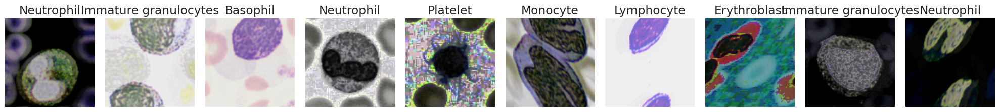

In [5]:
# Number of images to display
num_img = 10

# Set a random seed for reproducibility
random.seed(seed)

# Select random indices
random_indices = random.sample(range(len(X_train)), num_img)

# Create subplots
fig, axes = plt.subplots(1, num_img, figsize=(20, 5))

for i, idx in enumerate(random_indices):
    ax = axes[i]
    
    # Get the image and cast it to uint8
    image = X_train[idx]
    image_uint8 = (image).astype(np.uint8)
    
    # Handle color and grayscale images
    if image_uint8.shape[-1] == 1:
        image_uint8 = np.squeeze(image_uint8, axis=-1)
        ax.imshow(image_uint8, cmap='gray', vmin=0, vmax=255)
    else:
        ax.imshow(image_uint8)

    # Set the title based on the label
    label_index = np.argmax(y_train[idx])
    label = labels[label_index]
    
    ax.set_title(f'{label}')
    ax.axis('off')

plt.tight_layout()
plt.show()

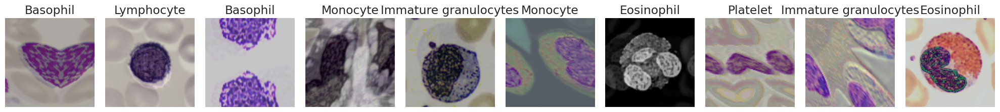

In [6]:
# Number of images to display
num_img = 10

# Set a random seed for reproducibility
random.seed(seed)

# Select random indices
random_indices = random.sample(range(len(X_val)), num_img)

# Create subplots
fig, axes = plt.subplots(1, num_img, figsize=(20, 5))

for i, idx in enumerate(random_indices):
    ax = axes[i]

    # Get the image and cast it to uint8
    image = X_val[idx]
    image_uint8 = (image).astype(np.uint8)

    # Handle color and grayscale images
    if image_uint8.shape[-1] == 1:
        image_uint8 = np.squeeze(image_uint8, axis=-1)
        ax.imshow(image_uint8, cmap='gray', vmin=0, vmax=255)
    else:
        ax.imshow(image_uint8)

    # Set the title based on the label
    label_index = np.argmax(y_val[idx])
    label = labels[label_index]
    ax.set_title(f'{label}')
    ax.axis('off')

plt.tight_layout()
plt.show()

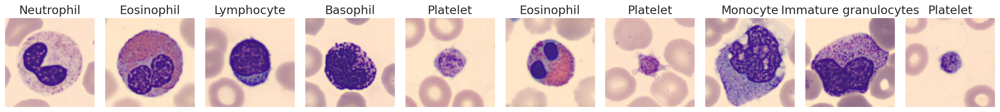

In [7]:
# Number of images to display
num_img = 10

# Set a random seed for reproducibility
random.seed(seed)

# Select random indices
random_indices = random.sample(range(len(X_test)), num_img)

# Create subplots
fig, axes = plt.subplots(1, num_img, figsize=(20, 5))

for i, idx in enumerate(random_indices):
    ax = axes[i]

    # Get the image and cast it to uint8
    image = X_test[idx]
    image_uint8 = (image).astype(np.uint8)

    # Handle color and grayscale images
    if image_uint8.shape[-1] == 1:
        image_uint8 = np.squeeze(image_uint8, axis=-1)
        ax.imshow(image_uint8, cmap='gray', vmin=0, vmax=255)
    else:
        ax.imshow(image_uint8)

    # Set the title based on the label
    label_index = np.argmax(y_test[idx])
    label = labels[label_index]
    ax.set_title(f'{label}')
    ax.axis('off')

plt.tight_layout()
plt.show()

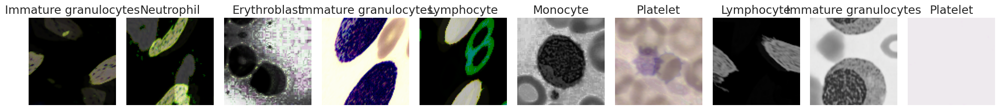

In [8]:
# Number of images to display
num_img = 10

# Set a random seed for reproducibility
random.seed(seed)

# Select random indices
random_indices = random.sample(range(len(X_test_augmented)), num_img)

# Create subplots
fig, axes = plt.subplots(1, num_img, figsize=(20, 5))

for i, idx in enumerate(random_indices):
    ax = axes[i]

    # Get the image and cast it to uint8
    image = X_test_augmented[idx]
    image_uint8 = (image).astype(np.uint8)

    # Handle color and grayscale images
    if image_uint8.shape[-1] == 1:
        image_uint8 = np.squeeze(image_uint8, axis=-1)
        ax.imshow(image_uint8, cmap='gray', vmin=0, vmax=255)
    else:
        ax.imshow(image_uint8)

    # Set the title based on the label
    label_index = np.argmax(y_test_augmented[idx])
    label = labels[label_index]
    ax.set_title(f'{label}')
    ax.axis('off')

plt.tight_layout()
plt.show()

### Class balancing

In [4]:
# Flatten the labels to class indices since they're in one-hot encoding
y_train_flat = np.argmax(y_train, axis=1)

# Calculate class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train_flat),
    y=y_train_flat
)

# Convert the class weights to a dictionary
class_weight_dict = dict(enumerate(class_weights))

# Print the calculated class weights
print("Class weights:")
for class_index, weight in class_weight_dict.items():
    print(f"Class {class_index}: Weight {weight:.2f}")

Class weights:
Class 0: Weight 1.75
Class 1: Weight 0.69
Class 2: Weight 1.38
Class 3: Weight 0.74
Class 4: Weight 1.76
Class 5: Weight 1.50
Class 6: Weight 0.64
Class 7: Weight 0.91


## 🧮 Define Network Parameters

In [5]:
# Input shape for the model
input_shape = X_train.shape[1:]

# Output shape for the model
output_shape = y_train.shape[1]

print("Input Shape:", input_shape)
print("Output Shape:", output_shape)

Input Shape: (96, 96, 3)
Output Shape: 8


In [6]:
# Number of training epochs
epochs = 200

# Batch size for training
batch_size = 64

# Print the defined parameters
print("Epochs:", epochs)
print("Batch Size:", batch_size)

Epochs: 200
Batch Size: 64


## **EfficientNetV2M**

---

**Key Features and Achievements**


## 🛠️ Transfer Learning















<img src="https://radekosmulski.com/content/images/2021/08/imagenet_banner.jpeg" width="700"/>

In [7]:
# Initialise EfficientNetV2M model with pretrained weights, for transfer learning
weights_path = '/kaggle/input/new-weights/EfficientNetV2M.weights.h5'

efficientnet = tfk.applications.EfficientNetV2M(
    input_shape=input_shape,
    include_top=False,
    weights=weights_path,
    pooling='avg',
    include_preprocessing=True
)

KeyboardInterrupt: 

Model: "efficientnetv2-m"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 96, 96, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 96, 96, 3) │          0 │ input_layer[0][0] │
│ (Rescaling)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 48, 48,    │        648 │ rescaling[0][0]   │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 48, 48,    │         96 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 48, 48,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 48, 48,    │      5,184 │ stem_activation[… │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 48, 48,    │         96 │ block1a_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 48, 48,    │          0 │ block1a_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 48, 48,    │          0 │ block1a_project_… │
│                     │ 24)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 48, 48,    │      5,184 │ block1a_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 48, 48,    │         96 │ block1b_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 48, 48,    │          0 │ block1b_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 48, 48,    │          0 │ block1b_project_… │
│ (Dropout)           │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 48, 48,    │          0 │ block1b_drop[0][… │
│                     │ 24)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 48, 48,    │      5,184 │ block1b_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 48, 48,    │         96 │ block1c_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 48, 48,    │          0 │ block1c_project_

 Total params: 53,150,388 (202.75 MB)

 Trainable params: 52,858,356 (201.64 MB)

 Non-trainable params: 292,032 (1.11 MB)

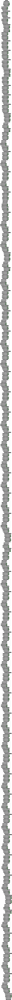

In [13]:
# Display a summary of the model architecture
efficientnet.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(efficientnet, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

#### Model with 1 dense layer

In [14]:
# Freeze all layers in EfficientNetV2M to use it solely as a feature extractor
efficientnet.trainable = False

# Define input layer with shape matching the input images
inputs = tfk.Input(shape=input_shape, name='input_layer')

# Pass inputs through the EfficientNetV2M feature extractor
x = efficientnet(inputs)
print("Shape after EfficientNetV2M:", x.shape)

# Add a Dropout layer for regularisation
x = tfkl.Dropout(0.3, name='dropout1')(x)
print("Shape after Dropout1:", x.shape)

# Add a final Dense layer for classification with softmax activation
outputs = tfkl.Dense(y_train.shape[-1], activation='softmax', name='dense3')(x)
print("Shape after Dense1:", outputs.shape)

# Define the complete model linking input and output
tl_model1 = tfk.Model(inputs=inputs, outputs=outputs, name='model1')

# Compile the model with categorical cross-entropy loss and Adam optimiser
tl_model1.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])  # default learning rate = 0.001

Shape after EfficientNetV2M: (None, 1280)
Shape after Dropout1: (None, 1280)
Shape after Dense1: (None, 8)


Model: "model1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-m (Functional)   │ (None, 1280)           │    53,150,388 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout1 (Dropout)              │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense3 (Dense)                  │ (None, 8)              │        10,248 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 53,160,636 (202.79 MB)

 Trainable params: 10,248 (40.03 KB)

 Non-trainable params: 53,150,388 (202.75 MB)

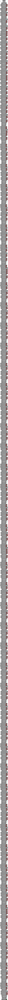

In [15]:
# Display a summary of the model architecture
tl_model1.summary()

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(tl_model1, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

#### Model with 2 dense layer

In [16]:
# Freeze all layers in EfficientNetV2M to use it solely as a feature extractor
efficientnet.trainable = False

# Define input layer with shape matching the input images
inputs = tfk.Input(shape=input_shape, name='input_layer')

# Pass inputs through the EfficientNetV2M feature extractor
x = efficientnet(inputs)
print("Shape after EfficientNetV2M:", x.shape)

# Add a Dense layer without activation
x = tfkl.Dense(512, name='dense1')(x)
print("Shape after Dense1:", x.shape)

# Add Batch Normalization
x = tfkl.BatchNormalization(name='batch_norm1')(x)
print("Shape after BatchNorm1:", x.shape)

# Add ReLU activation
x = tfkl.Activation('relu', name='activation1')(x)
print("Shape after Activation1:", x.shape)

# Add a Dropout layer for regularisation
x = tfkl.Dropout(0.5, name='dropout1')(x)
print("Shape after Dropout1:", x.shape)

# Add final Dense layer for classification with softmax activation
outputs = tfkl.Dense(y_train.shape[-1], activation='softmax', name='dense3')(x)
print("Shape after Dense3:", outputs.shape)

# Define the complete model linking input and output
tl_model2 = tfk.Model(inputs=inputs, outputs=outputs, name='model2')

# Compile the model with categorical cross-entropy loss and Adam optimiser
tl_model2.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])  # default learning rate = 0.001

Shape after EfficientNetV2M: (None, 1280)
Shape after Dense1: (None, 512)
Shape after BatchNorm1: (None, 512)
Shape after Activation1: (None, 512)
Shape after Dropout1: (None, 512)
Shape after Dense3: (None, 8)


Model: "model2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-m (Functional)   │ (None, 1280)           │    53,150,388 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm1                     │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation1 (Activation)        │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout1 (Dropout)              │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense3 (Dense)                  │ (None, 8)              │         4,104 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 53,812,412 (205.28 MB)

 Trainable params: 661,000 (2.52 MB)

 Non-trainable params: 53,151,412 (202.76 MB)

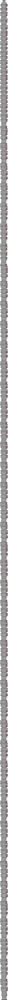

In [17]:
# Display a summary of the model architecture
tl_model2.summary()

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(tl_model2, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

#### Model with 3 dense layers

In [18]:
# Freeze all layers in EfficientNetV2M to use it solely as a feature extractor
efficientnet.trainable = False

# Define input layer with shape matching the input images
inputs = tfk.Input(shape=input_shape, name='input_layer')

# Pass inputs through the EfficientNetV2M feature extractor
x = efficientnet(inputs)
print("Shape after EfficientNetV2M:", x.shape)

# Add a Dense layer without activation
x = tfkl.Dense(512, name='dense1')(x)
print("Shape after Dense1:", x.shape)

# Add Batch Normalization
x = tfkl.BatchNormalization(name='batch_norm1')(x)
print("Shape after BatchNorm1:", x.shape)

# Add ReLU activation
x = tfkl.Activation('relu', name='activation1')(x)
print("Shape after Activation1:", x.shape)

# Add a Dropout layer for regularisation
x = tfkl.Dropout(0.5, name='dropout1')(x)
print("Shape after Dropout1:", x.shape)

# Add another Dense layer without activation
x = tfkl.Dense(256, name='dense2')(x)
print("Shape after Dense2:", x.shape)

# Add Batch Normalization
x = tfkl.BatchNormalization(name='batch_norm2')(x)
print("Shape after BatchNorm2:", x.shape)

# Add ReLU activation
x = tfkl.Activation('relu', name='activation2')(x)
print("Shape after Activation2:", x.shape)

# Add another Dropout layer for regularisation
x = tfkl.Dropout(0.5, name='dropout2')(x)
print("Shape after Dropout2:", x.shape)

# Add final Dense layer for classification with softmax activation
outputs = tfkl.Dense(y_train.shape[-1], activation='softmax', name='dense3')(x)
print("Shape after Dense3:", outputs.shape)

# Define the complete model linking input and output
tl_model3 = tfk.Model(inputs=inputs, outputs=outputs, name='model3')

# Compile the model with categorical cross-entropy loss and Adam optimiser
tl_model3.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])  # default learning rate = 0.001

Shape after EfficientNetV2M: (None, 1280)
Shape after Dense1: (None, 512)
Shape after BatchNorm1: (None, 512)
Shape after Activation1: (None, 512)
Shape after Dropout1: (None, 512)
Shape after Dense2: (None, 256)
Shape after BatchNorm2: (None, 256)
Shape after Activation2: (None, 256)
Shape after Dropout2: (None, 256)
Shape after Dense3: (None, 8)


Model: "model3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-m (Functional)   │ (None, 1280)           │    53,150,388 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm1                     │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation1 (Activation)        │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout1 (Dropout)              │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense2 (Dense)                  │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm2                     │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation2 (Activation)        │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout2 (Dropout)              │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense3 (Dense)                  │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 53,942,716 (205.78 MB)

 Trainable params: 790,792 (3.02 MB)

 Non-trainable params: 53,151,924 (202.76 MB)

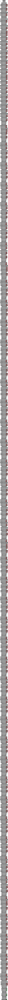

In [19]:
# Display a summary of the model architecture
tl_model3.summary()

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(tl_model3, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [7]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_accuracy',       # Metric to monitor
    mode='max',                   # Mode ('max' for accuracy)
    patience=20,                  # Number of epochs with no improvement before stopping
    restore_best_weights=True     # Restore the model weights from the epoch with the best value of the monitored metric
)

In [8]:
# Define the ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',           # Metric to monitor
    factor=0.5,                   # Factor by which the learning rate will be reduced
    patience=5,                   # Number of epochs with no improvement before reducing learning rate
    verbose=1,                    # Verbosity mode (0 = silent, 1 = updates messages)
    min_lr=1e-6                   # Lower bound on the learning rate
)

In [26]:
# Train the model 1
tl_history1 = tl_model1.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy1 = round(max(tl_history1['val_accuracy']) * 100, 2)
print(f'Final validation accuracy 1: {final_val_accuracy1}%')

# Save the trained model to a file, including final accuracy in the filename
model_filename = f'EfficientNetV2M1_{final_val_accuracy1}.keras'
tl_model1.save(model_filename)

# Free memory by deleting the model instance
del tl_model1

Epoch 1/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 303s 471ms/step - accuracy: 0.3119 - loss: 1.8701 - val_accuracy: 0.5271 - val_loss: 1.4570 - learning_rate: 0.0010
Epoch 2/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - accuracy: 0.4758 - loss: 1.5389 - val_accuracy: 0.5592 - val_loss: 1.3340 - learning_rate: 0.0010
Epoch 3/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.4978 - loss: 1.4493 - val_accuracy: 0.5713 - val_loss: 1.2804 - learning_rate: 0.0010
Epoch 4/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.5080 - loss: 1.4109 - val_accuracy: 0.5844 - val_loss: 1.2339 - learning_rate: 0.0010
Epoch 5/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - accuracy: 0.5182 - loss: 1.3795 - val_accuracy: 0.5932 - val_loss: 1.2163 - learning_rate: 0.0010
Epoch 6/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - accuracy: 0.5186 - loss: 1.3662 - val_accuracy: 0.5957 - val_loss: 1.2014 - learning_rate: 0.0010
Epoch 7/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0

In [23]:
# Train the model 2
tl_history2 = tl_model2.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy2 = round(max(tl_history2['val_accuracy']) * 100, 2)
print(f'Final validation accuracy 2: {final_val_accuracy2}%')

# Save the trained model to a file, including final accuracy in the filename
model_filename = f'EfficientNetV2M2_{final_val_accuracy2}.keras'
tl_model2.save(model_filename)

# Free memory by deleting the model instance
del tl_model2

Epoch 1/200


I0000 00:00:1732221079.129224     105 service.cc:145] XLA service 0x79e7740048c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732221079.129289     105 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  2/337 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.1250 - loss: 2.8270     

I0000 00:00:1732221186.288808     105 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


337/337 ━━━━━━━━━━━━━━━━━━━━ 284s 429ms/step - accuracy: 0.3682 - loss: 1.8839 - val_accuracy: 0.5220 - val_loss: 1.2688 - learning_rate: 0.0010
Epoch 2/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - accuracy: 0.5049 - loss: 1.3993 - val_accuracy: 0.5692 - val_loss: 1.1748 - learning_rate: 0.0010
Epoch 3/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - accuracy: 0.5358 - loss: 1.3190 - val_accuracy: 0.5811 - val_loss: 1.1334 - learning_rate: 0.0010
Epoch 4/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - accuracy: 0.5480 - loss: 1.2586 - val_accuracy: 0.5844 - val_loss: 1.1246 - learning_rate: 0.0010
Epoch 5/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - accuracy: 0.5673 - loss: 1.2147 - val_accuracy: 0.6253 - val_loss: 1.0346 - learning_rate: 0.0010
Epoch 6/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - accuracy: 0.5754 - loss: 1.1864 - val_accuracy: 0.6102 - val_loss: 1.0736 - learning_rate: 0.0010
Epoch 7/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - accuracy: 0.5807 - loss

In [24]:
# Train the model 3
tl_history3 = tl_model3.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy3 = round(max(tl_history3['val_accuracy']) * 100, 2)
print(f'Final validation accuracy 3: {final_val_accuracy3}%')

# Save the trained model to a file, including final accuracy in the filename
model_filename = f'EfficientNetV2M3_{final_val_accuracy3}.keras'
tl_model3.save(model_filename)

# Free memory by deleting the model instance
del tl_model3

Epoch 1/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 307s 477ms/step - accuracy: 0.2848 - loss: 2.0993 - val_accuracy: 0.5296 - val_loss: 1.2908 - learning_rate: 0.0010
Epoch 2/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.4502 - loss: 1.5345 - val_accuracy: 0.5708 - val_loss: 1.1981 - learning_rate: 0.0010
Epoch 3/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.4942 - loss: 1.3995 - val_accuracy: 0.5419 - val_loss: 1.2700 - learning_rate: 0.0010
Epoch 4/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - accuracy: 0.5245 - loss: 1.3399 - val_accuracy: 0.5991 - val_loss: 1.1053 - learning_rate: 0.0010
Epoch 5/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.5387 - loss: 1.2900 - val_accuracy: 0.5982 - val_loss: 1.1000 - learning_rate: 0.0010
Epoch 6/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.5439 - loss: 1.2615 - val_accuracy: 0.5985 - val_loss: 1.1070 - learning_rate: 0.0010
Epoch 7/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0

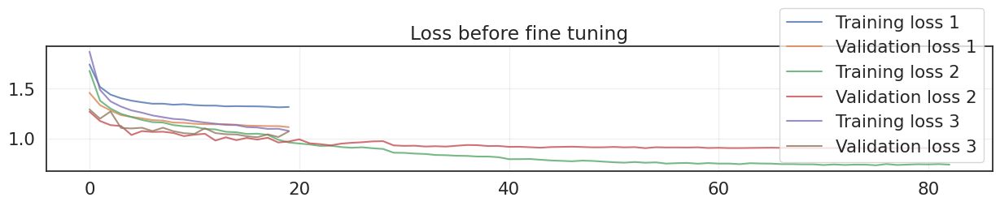

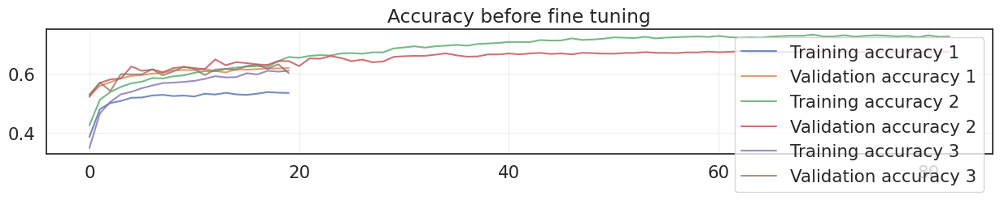

In [27]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(tl_history1['loss'], label='Training loss 1', alpha=.8)
plt.plot(tl_history1['val_loss'], label='Validation loss 1', alpha=.8)
plt.plot(tl_history2['loss'], label='Training loss 2', alpha=.8)
plt.plot(tl_history2['val_loss'], label='Validation loss 2', alpha=.8)
plt.plot(tl_history3['loss'], label='Training loss 3', alpha=.8)
plt.plot(tl_history3['val_loss'], label='Validation loss 3', alpha=.8)
plt.title('Loss before fine tuning')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(tl_history1['accuracy'], label='Training accuracy 1', alpha=.8)
plt.plot(tl_history1['val_accuracy'], label='Validation accuracy 1', alpha=.8)
plt.plot(tl_history2['accuracy'], label='Training accuracy 2', alpha=.8)
plt.plot(tl_history2['val_accuracy'], label='Validation accuracy 2', alpha=.8)
plt.plot(tl_history3['accuracy'], label='Training accuracy 3', alpha=.8)
plt.plot(tl_history3['val_accuracy'], label='Validation accuracy 3', alpha=.8)
plt.title('Accuracy before fine tuning')
plt.legend()
plt.grid(alpha=.3)

plt.show()

## 🛠️ Fine Tuning















<img src="https://www.researchgate.net/publication/359405075/figure/fig2/AS:1182999492214798@1659060466845/Concept-of-fine-tuning-and-feature-extraction_W640.jpg" width="700"/>


In [28]:
# Re-load the model after transfer learning
ft_model1 = tfk.models.load_model('/kaggle/working/EfficientNetV2M1_61.97.keras') # model 1
ft_model2 = tfk.models.load_model('/kaggle/working/EfficientNetV2M2_67.67.keras') # model 2
ft_model3 = tfk.models.load_model('/kaggle/working/EfficientNetV2M3_63.28.keras') # model 3

In [30]:
# Set the EfficientNetV2M model layers as trainable
ft_model1.get_layer('efficientnetv2-m').trainable = True
ft_model2.get_layer('efficientnetv2-m').trainable = True
ft_model3.get_layer('efficientnetv2-m').trainable = True

In [31]:
def print_model_layers(model, base_model_name):
    """
    Print the number of layers, their names, and their trainability status for a given model.

    Args:
        model: The TensorFlow/Keras model.
        base_model_name: The name of the base model layer (e.g., 'MobilenetV3small').
    """
    base_model = model.get_layer(base_model_name)
    layers = base_model.layers
    print(f"Total number of layers in '{base_model_name}': {len(layers)}\n")
    
    print("Index | Layer Name                      | Trainable")
    print("-------------------------------------------------")
    for i, layer in enumerate(layers):
        print(f"{i:<6} | {layer.name:<30} | {layer.trainable}")

print_model_layers(ft_model1, 'efficientnetv2-m')

Total number of layers in 'efficientnetv2-m': 741

Index | Layer Name                      | Trainable
-------------------------------------------------
0      | input_layer                    | True
1      | rescaling                      | True
2      | stem_conv                      | True
3      | stem_bn                        | True
4      | stem_activation                | True
5      | block1a_project_conv           | True
6      | block1a_project_bn             | True
7      | block1a_project_activation     | True
8      | block1a_add                    | True
9      | block1b_project_conv           | True
10     | block1b_project_bn             | True
11     | block1b_project_activation     | True
12     | block1b_drop                   | True
13     | block1b_add                    | True
14     | block1c_project_conv           | True
15     | block1c_project_bn             | True
16     | block1c_project_activation     | True
17     | block1c_drop                   | True
1

In [32]:
# Set the number of layers to freeze
N = 520  # adjust based on your model (~70% of pre-trained model)

# Set the first N layers as non-trainable in model 1
for i, layer in enumerate(ft_model1.get_layer('efficientnetv2-m').layers[:N]):
    layer.trainable = False
# Set the BatchNorm layers as non-trainable
for layer in ft_model1.get_layer('efficientnetv2-m').layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False



# Set the first N layers as non-trainable in model 2
for i, layer in enumerate(ft_model2.get_layer('efficientnetv2-m').layers[:N]):
    layer.trainable = False
# Set the BatchNorm layers as non-trainable
for layer in ft_model2.get_layer('efficientnetv2-m').layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False



# Set the first N layers as non-trainable in model 3
for i, layer in enumerate(ft_model3.get_layer('efficientnetv2-m').layers[:N]):
    layer.trainable = False
# Set the BatchNorm layers as non-trainable
for layer in ft_model3.get_layer('efficientnetv2-m').layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False





# Print layer indices, names, and trainability status
print("Model 1")
for i, layer in enumerate(ft_model1.get_layer('efficientnetv2-m').layers):
    print(i, layer.name, layer.trainable)
print("")

print("Model 2")
for i, layer in enumerate(ft_model2.get_layer('efficientnetv2-m').layers):
    print(i, layer.name, layer.trainable)
print("")

print("Model 3")
for i, layer in enumerate(ft_model3.get_layer('efficientnetv2-m').layers):
    print(i, layer.name, layer.trainable)

Model 1
0 input_layer False
1 rescaling False
2 stem_conv False
3 stem_bn False
4 stem_activation False
5 block1a_project_conv False
6 block1a_project_bn False
7 block1a_project_activation False
8 block1a_add False
9 block1b_project_conv False
10 block1b_project_bn False
11 block1b_project_activation False
12 block1b_drop False
13 block1b_add False
14 block1c_project_conv False
15 block1c_project_bn False
16 block1c_project_activation False
17 block1c_drop False
18 block1c_add False
19 block2a_expand_conv False
20 block2a_expand_bn False
21 block2a_expand_activation False
22 block2a_project_conv False
23 block2a_project_bn False
24 block2b_expand_conv False
25 block2b_expand_bn False
26 block2b_expand_activation False
27 block2b_project_conv False
28 block2b_project_bn False
29 block2b_drop False
30 block2b_add False
31 block2c_expand_conv False
32 block2c_expand_bn False
33 block2c_expand_activation False
34 block2c_project_conv False
35 block2c_project_bn False
36 block2c_drop False


In [ ]:
# Display a summary of the model 1 architecture
ft_model1.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model1, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Display a summary of the model 2 architecture
ft_model2.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model2, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Display a summary of the model 3 architecture
ft_model3.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model3, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [33]:
# Compile the model
ft_model1.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])
ft_model2.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])
ft_model3.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

In [34]:
# Fine-tune the model 1
ft_history1 = ft_model1.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr]
).history

# Calculate and print the final validation accuracy
final_val_accuracy1 = round(max(ft_history1['val_accuracy']) * 100, 2)
print(f'Final validation accuracy 1: {final_val_accuracy1}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'EfficientNetV2M1_FT_' + str(final_val_accuracy1) + '.keras'
ft_model1.save(model_filename)

# Delete the model to free up resources
del ft_model1

Epoch 1/200


I0000 00:00:1732226694.901694     105 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_2', 232 bytes spill stores, 236 bytes spill loads



337/337 ━━━━━━━━━━━━━━━━━━━━ 339s 512ms/step - accuracy: 0.5979 - loss: 1.1477 - val_accuracy: 0.7357 - val_loss: 0.7307 - learning_rate: 1.0000e-04
Epoch 2/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - accuracy: 0.7460 - loss: 0.7210 - val_accuracy: 0.7680 - val_loss: 0.6630 - learning_rate: 1.0000e-04
Epoch 3/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - accuracy: 0.8016 - loss: 0.5459 - val_accuracy: 0.7704 - val_loss: 0.6969 - learning_rate: 1.0000e-04
Epoch 4/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - accuracy: 0.8532 - loss: 0.4061 - val_accuracy: 0.7753 - val_loss: 0.7254 - learning_rate: 1.0000e-04
Epoch 5/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - accuracy: 0.8797 - loss: 0.3233 - val_accuracy: 0.7652 - val_loss: 0.8092 - learning_rate: 1.0000e-04
Epoch 6/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - accuracy: 0.9110 - loss: 0.2422 - val_accuracy: 0.7623 - val_loss: 0.7800 - learning_rate: 1.0000e-04
Epoch 7/200
336/337 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/st

In [35]:
# Fine-tune the model 2
ft_history2 = ft_model2.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr]
).history

# Calculate and print the final validation accuracy
final_val_accuracy2 = round(max(ft_history2['val_accuracy']) * 100, 2)
print(f'Final validation accuracy 2: {final_val_accuracy2}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'EfficientNetV2M2_FT_' + str(final_val_accuracy2) + '.keras'
ft_model2.save(model_filename)

# Delete the model to free up resources
del ft_model2

Epoch 1/200


I0000 00:00:1732229542.588264     104 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_4', 232 bytes spill stores, 236 bytes spill loads



337/337 ━━━━━━━━━━━━━━━━━━━━ 288s 442ms/step - accuracy: 0.6898 - loss: 0.9171 - val_accuracy: 0.7166 - val_loss: 0.8517 - learning_rate: 1.0000e-04
Epoch 2/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step - accuracy: 0.7725 - loss: 0.6182 - val_accuracy: 0.7479 - val_loss: 0.7171 - learning_rate: 1.0000e-04
Epoch 3/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - accuracy: 0.8160 - loss: 0.4970 - val_accuracy: 0.7450 - val_loss: 0.7466 - learning_rate: 1.0000e-04
Epoch 4/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 108ms/step - accuracy: 0.8533 - loss: 0.3867 - val_accuracy: 0.7499 - val_loss: 0.7674 - learning_rate: 1.0000e-04
Epoch 5/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - accuracy: 0.8815 - loss: 0.3216 - val_accuracy: 0.7666 - val_loss: 0.7477 - learning_rate: 1.0000e-04
Epoch 6/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 108ms/step - accuracy: 0.9098 - loss: 0.2353 - val_accuracy: 0.7613 - val_loss: 0.8463 - learning_rate: 1.0000e-04
Epoch 7/200
336/337 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/st

In [36]:
# Fine-tune the model 3
ft_history3 = ft_model3.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr]
).history

# Calculate and print the final validation accuracy
final_val_accuracy3 = round(max(ft_history3['val_accuracy']) * 100, 2)
print(f'Final validation accuracy 3: {final_val_accuracy3}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'EfficientNetV2M3_FT_' + str(final_val_accuracy3) + '.keras'
ft_model3.save(model_filename)

# Delete the model to free up resources
del ft_model3

Epoch 1/200


I0000 00:00:1732230564.216747     105 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_5', 232 bytes spill stores, 236 bytes spill loads



337/337 ━━━━━━━━━━━━━━━━━━━━ 296s 448ms/step - accuracy: 0.5690 - loss: 1.2252 - val_accuracy: 0.7191 - val_loss: 0.7792 - learning_rate: 1.0000e-04
Epoch 2/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - accuracy: 0.7177 - loss: 0.8086 - val_accuracy: 0.7560 - val_loss: 0.6849 - learning_rate: 1.0000e-04
Epoch 3/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - accuracy: 0.7720 - loss: 0.6597 - val_accuracy: 0.7648 - val_loss: 0.6847 - learning_rate: 1.0000e-04
Epoch 4/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - accuracy: 0.8197 - loss: 0.5250 - val_accuracy: 0.7729 - val_loss: 0.6922 - learning_rate: 1.0000e-04
Epoch 5/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - accuracy: 0.8526 - loss: 0.4323 - val_accuracy: 0.7740 - val_loss: 0.7070 - learning_rate: 1.0000e-04
Epoch 6/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - accuracy: 0.8789 - loss: 0.3473 - val_accuracy: 0.7864 - val_loss: 0.6911 - learning_rate: 1.0000e-04
Epoch 7/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/

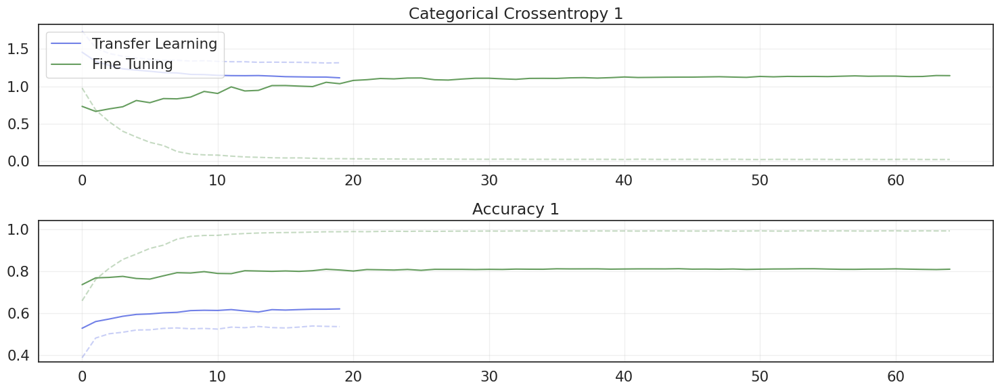

In [37]:
# Create figure and subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6))

# Plot categorical cross-entropy loss for both Transfer Learning and Fine Tuning stages
ax1.plot(tl_history1['loss'], alpha=0.3, color='#4D61E2', linestyle='--')
ax1.plot(tl_history1['val_loss'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax1.plot(ft_history1['loss'], alpha=0.3, color='#408537', linestyle='--')
ax1.plot(ft_history1['val_loss'], label='Fine Tuning', alpha=0.8, color='#408537')
ax1.set_title('Categorical Crossentropy 1')
ax1.legend(loc='upper left')
ax1.grid(alpha=0.3)

# Plot accuracy for both Transfer Learning and Fine Tuning stages
ax2.plot(tl_history1['accuracy'], alpha=0.3, color='#4D61E2', linestyle='--')
ax2.plot(tl_history1['val_accuracy'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax2.plot(ft_history1['accuracy'], alpha=0.3, color='#408537', linestyle='--')
ax2.plot(ft_history1['val_accuracy'], label='Fine Tuning', alpha=0.8, color='#408537')
ax2.set_title('Accuracy 1')

# Dynamically calculate y-axis limits for accuracy
all_accuracies = (
    tl_history1['accuracy'] + 
    tl_history1['val_accuracy'] + 
    ft_history1['accuracy'] + 
    ft_history1['val_accuracy']
)
ax2.set_ylim([min(all_accuracies) * 0.95, max(all_accuracies) * 1.05])
ax2.grid(alpha=0.3)

# Adjust layout to prevent overlap and display the plots
plt.tight_layout()
plt.show()

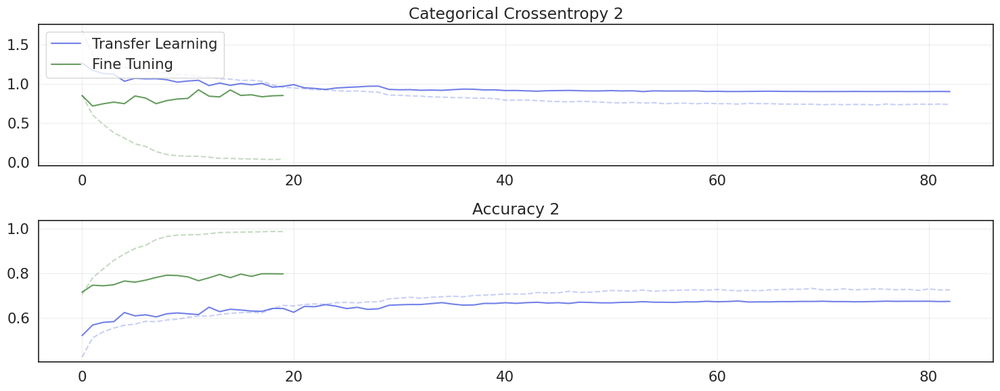

In [38]:
# Create figure and subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6))

# Plot categorical cross-entropy loss for both Transfer Learning and Fine Tuning stages
ax1.plot(tl_history2['loss'], alpha=0.3, color='#4D61E2', linestyle='--')
ax1.plot(tl_history2['val_loss'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax1.plot(ft_history2['loss'], alpha=0.3, color='#408537', linestyle='--')
ax1.plot(ft_history2['val_loss'], label='Fine Tuning', alpha=0.8, color='#408537')
ax1.set_title('Categorical Crossentropy 2')
ax1.legend(loc='upper left')
ax1.grid(alpha=0.3)

# Plot accuracy for both Transfer Learning and Fine Tuning stages
ax2.plot(tl_history2['accuracy'], alpha=0.3, color='#4D61E2', linestyle='--')
ax2.plot(tl_history2['val_accuracy'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax2.plot(ft_history2['accuracy'], alpha=0.3, color='#408537', linestyle='--')
ax2.plot(ft_history2['val_accuracy'], label='Fine Tuning', alpha=0.8, color='#408537')
ax2.set_title('Accuracy 2')

# Dynamically calculate y-axis limits for accuracy
all_accuracies = (
    tl_history2['accuracy'] + 
    tl_history2['val_accuracy'] + 
    ft_history2['accuracy'] + 
    ft_history2['val_accuracy']
)
ax2.set_ylim([min(all_accuracies) * 0.95, max(all_accuracies) * 1.05])
ax2.grid(alpha=0.3)

# Adjust layout to prevent overlap and display the plots
plt.tight_layout()
plt.show()

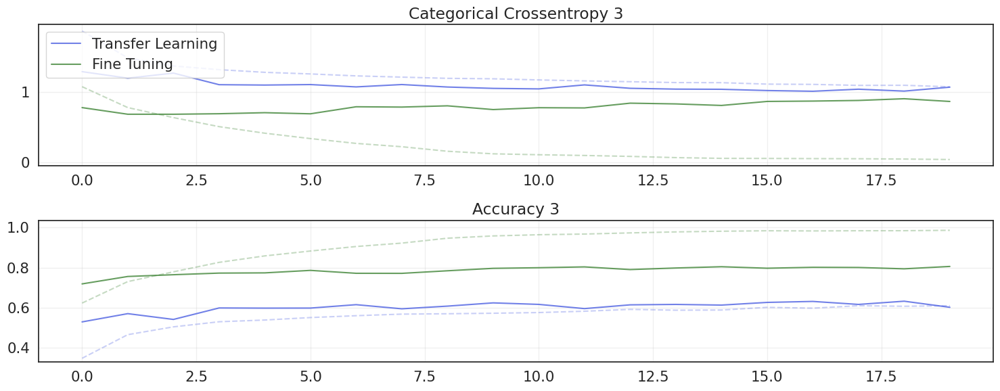

In [40]:
# Create figure and subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6))

# Plot categorical cross-entropy loss for both Transfer Learning and Fine Tuning stages
ax1.plot(tl_history3['loss'], alpha=0.3, color='#4D61E2', linestyle='--')
ax1.plot(tl_history3['val_loss'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax1.plot(ft_history3['loss'], alpha=0.3, color='#408537', linestyle='--')
ax1.plot(ft_history3['val_loss'], label='Fine Tuning', alpha=0.8, color='#408537')
ax1.set_title('Categorical Crossentropy 3')
ax1.legend(loc='upper left')
ax1.grid(alpha=0.3)

# Plot accuracy for both Transfer Learning and Fine Tuning stages
ax2.plot(tl_history3['accuracy'], alpha=0.3, color='#4D61E2', linestyle='--')
ax2.plot(tl_history3['val_accuracy'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax2.plot(ft_history3['accuracy'], alpha=0.3, color='#408537', linestyle='--')
ax2.plot(ft_history3['val_accuracy'], label='Fine Tuning', alpha=0.8, color='#408537')
ax2.set_title('Accuracy 3')

# Dynamically calculate y-axis limits for accuracy
all_accuracies = (
    tl_history3['accuracy'] + 
    tl_history3['val_accuracy'] + 
    ft_history3['accuracy'] + 
    ft_history3['val_accuracy']
)
ax2.set_ylim([min(all_accuracies) * 0.95, max(all_accuracies) * 1.05])
ax2.grid(alpha=0.3)

# Adjust layout to prevent overlap and display the plots
plt.tight_layout()
plt.show()

## Final fine tuning
Unfreeze all layers

In [9]:
# Re-load the model after first fine tuning
ft_full_model1 = tfk.models.load_model('/kaggle/input/ft-weights/EfficientNetV2M1_FT_81.19.keras')  # model 1

N = 520

# Unfreeze all layers
for i, layer in enumerate(ft_full_model1.get_layer('efficientnetv2-m').layers[:N]):
    layer.trainable = True

# Recompile the model
ft_full_model1.compile(
    loss=tfk.losses.CategoricalCrossentropy(),
    optimizer=tfk.optimizers.Adam(learning_rate=1e-4),
    metrics=['accuracy']
)

# Training with full fine tuning
ft_history1_full = ft_full_model1.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr]
).history

# Calculate and print the final validation accuracy
final_val_accuracy1_full = round(max(ft_history1_full['val_accuracy']) * 100, 2)
print(f'Final validation accuracy 1 (full): {final_val_accuracy1_full}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'EfficientNetV2M1_FTfull_' + str(final_val_accuracy1_full) + '.keras'
ft_full_model1.save(model_filename)

# Delete the model to free up resources
del ft_full_model1

Epoch 1/200


I0000 00:00:1732358248.931943      97 service.cc:145] XLA service 0x7f05e8005400 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732358248.932000      97 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1732358468.417769      97 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_19', 232 bytes spill stores, 236 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_20', 16 bytes spill stores, 16 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_17', 232 bytes spill stores, 236 bytes spill loads

I0000 00:00:1732358468.644776      97 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


337/337 ━━━━━━━━━━━━━━━━━━━━ 595s 865ms/step - accuracy: 0.7222 - loss: 0.9031 - val_accuracy: 0.7976 - val_loss: 0.5808 - learning_rate: 1.0000e-04
Epoch 2/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 71s 211ms/step - accuracy: 0.9007 - loss: 0.2760 - val_accuracy: 0.8108 - val_loss: 0.6761 - learning_rate: 1.0000e-04
Epoch 3/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 71s 211ms/step - accuracy: 0.9495 - loss: 0.1393 - val_accuracy: 0.8235 - val_loss: 0.7132 - learning_rate: 1.0000e-04
Epoch 4/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 71s 211ms/step - accuracy: 0.9631 - loss: 0.1007 - val_accuracy: 0.8379 - val_loss: 0.7259 - learning_rate: 1.0000e-04
Epoch 5/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 71s 211ms/step - accuracy: 0.9719 - loss: 0.0721 - val_accuracy: 0.8451 - val_loss: 0.6856 - learning_rate: 1.0000e-04
Epoch 6/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.9759 - loss: 0.0662
Epoch 6: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
337/337 ━━━━━━━━━━━━━━━━━━━━ 70s 209ms/step - 

In [11]:
# Re-load the model after first fine tuning
ft_full_model2 = tfk.models.load_model('/kaggle/input/ft-weights/EfficientNetV2M2_FT_79.91.keras')  # model 2

N = 520

# Unfreeze all layers
for i, layer in enumerate(ft_full_model2.get_layer('efficientnetv2-m').layers[:N]):
    layer.trainable = True

# Recompile the model
ft_full_model2.compile(
    loss=tfk.losses.CategoricalCrossentropy(),
    optimizer=tfk.optimizers.Adam(learning_rate=1e-4),
    metrics=['accuracy']
)

# Training with full fine tuning
ft_history2_full = ft_full_model2.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr]
).history

# Calculate and print the final validation accuracy
final_val_accuracy2_full = round(max(ft_history2_full['val_accuracy']) * 100, 2)
print(f'Final validation accuracy 2 (full): {final_val_accuracy2_full}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'EfficientNetV2M2_FTfull_' + str(final_val_accuracy2_full) + '.keras'
ft_full_model2.save(model_filename)

# Delete the model to free up resources
del ft_full_model2

Epoch 1/200


I0000 00:00:1732287445.164247     121 service.cc:145] XLA service 0x7a16b4005040 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732287445.164299     121 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1732287661.844203     121 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_19', 232 bytes spill stores, 236 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_22', 16 bytes spill stores, 16 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_21', 232 bytes spill stores, 236 bytes spill loads

I0000 00:00:1732287662.050042     121 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


337/337 ━━━━━━━━━━━━━━━━━━━━ 595s 868ms/step - accuracy: 0.6496 - loss: 1.0479 - val_accuracy: 0.8013 - val_loss: 0.5647 - learning_rate: 1.0000e-04
Epoch 2/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 72s 212ms/step - accuracy: 0.8503 - loss: 0.4102 - val_accuracy: 0.8380 - val_loss: 0.5275 - learning_rate: 1.0000e-04
Epoch 3/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 72s 212ms/step - accuracy: 0.9203 - loss: 0.2257 - val_accuracy: 0.8460 - val_loss: 0.5398 - learning_rate: 1.0000e-04
Epoch 4/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 71s 211ms/step - accuracy: 0.9646 - loss: 0.1033 - val_accuracy: 0.8359 - val_loss: 0.6536 - learning_rate: 1.0000e-04
Epoch 5/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 72s 212ms/step - accuracy: 0.9674 - loss: 0.0855 - val_accuracy: 0.8425 - val_loss: 0.6901 - learning_rate: 1.0000e-04
Epoch 6/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 72s 214ms/step - accuracy: 0.9747 - loss: 0.0688 - val_accuracy: 0.8468 - val_loss: 0.6589 - learning_rate: 1.0000e-04
Epoch 7/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/s

In [ ]:
# Re-load the model after first fine tuning
ft_full_model3 = tfk.models.load_model('/kaggle/input/ft-weights/EfficientNetV2M3_FT_80.61.keras')  # model 3

N = 520

# Unfreeze all layers
for i, layer in enumerate(ft_full_model3.get_layer('efficientnetv2-m').layers[:N]):
    layer.trainable = True
# Set all BatchNorm layers as non-trainable
for layer in ft_full_model3.get_layer('efficientnetv2-m').layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False


# Recompile the model
ft_full_model3.compile(
    loss=tfk.losses.CategoricalCrossentropy(),
    optimizer=tfk.optimizers.Adam(learning_rate=1e-4),
    metrics=['accuracy']
)

# Training with full fine tuning
ft_history3_full = ft_full_model3.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr]
).history

# Calculate and print the final validation accuracy
final_val_accuracy3_full = round(max(ft_history3_full['val_accuracy']) * 100, 2)
print(f'Final validation accuracy 3 (full): {final_val_accuracy3_full}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'EfficientNetV2M3_FTfull_def_' + str(final_val_accuracy3_full) + '.keras'
ft_full_model3.save(model_filename)

# Delete the model to free up resources
del ft_full_model3

Epoch 1/200


I0000 00:00:1732363215.877903      94 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_23', 16 bytes spill stores, 16 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_22', 232 bytes spill stores, 236 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_20', 232 bytes spill stores, 236 bytes spill loads



337/337 ━━━━━━━━━━━━━━━━━━━━ 414s 624ms/step - accuracy: 0.7615 - loss: 0.7016 - val_accuracy: 0.8303 - val_loss: 0.5097 - learning_rate: 1.0000e-04
Epoch 2/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 62s 183ms/step - accuracy: 0.8801 - loss: 0.3578 - val_accuracy: 0.8333 - val_loss: 0.5452 - learning_rate: 1.0000e-04
Epoch 3/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 62s 184ms/step - accuracy: 0.9277 - loss: 0.2132 - val_accuracy: 0.8542 - val_loss: 0.5192 - learning_rate: 1.0000e-04
Epoch 4/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 63s 187ms/step - accuracy: 0.9515 - loss: 0.1594 - val_accuracy: 0.8694 - val_loss: 0.4794 - learning_rate: 1.0000e-04
Epoch 5/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 63s 186ms/step - accuracy: 0.9650 - loss: 0.1041 - val_accuracy: 0.8722 - val_loss: 0.4511 - learning_rate: 1.0000e-04
Epoch 6/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 62s 184ms/step - accuracy: 0.9692 - loss: 0.0909 - val_accuracy: 0.8649 - val_loss: 0.5246 - learning_rate: 1.0000e-04
Epoch 7/200
337/337 ━━━━━━━━━━━━━━━━━━━━ 62s 185ms/

## 🕹️ Use the Model - Make Inference

### Test model on test set

#### 1. Test set without augmentation

In [ ]:
# Load the fine-tuned EfficientNetV2M model for prediction on external images
ft_model1 = tfk.models.load_model('/kaggle/working/EfficientNetV2M1_FTfull_86.59.keras')
ft_model2 = tfk.models.load_model('/kaggle/input/ft-full-weights/EfficientNetV2M2_FTfull_87.63.keras')
ft_model3 = tfk.models.load_model('/kaggle/working/EfficientNetV2M3_FTfull_def_90.67.keras')

Accuracy 1 score over the test set: 0.9707
Precision 1 score over the test set: 0.9717
Recall score 1 over the test set: 0.9707
F1 score 1 over the test set: 0.9708


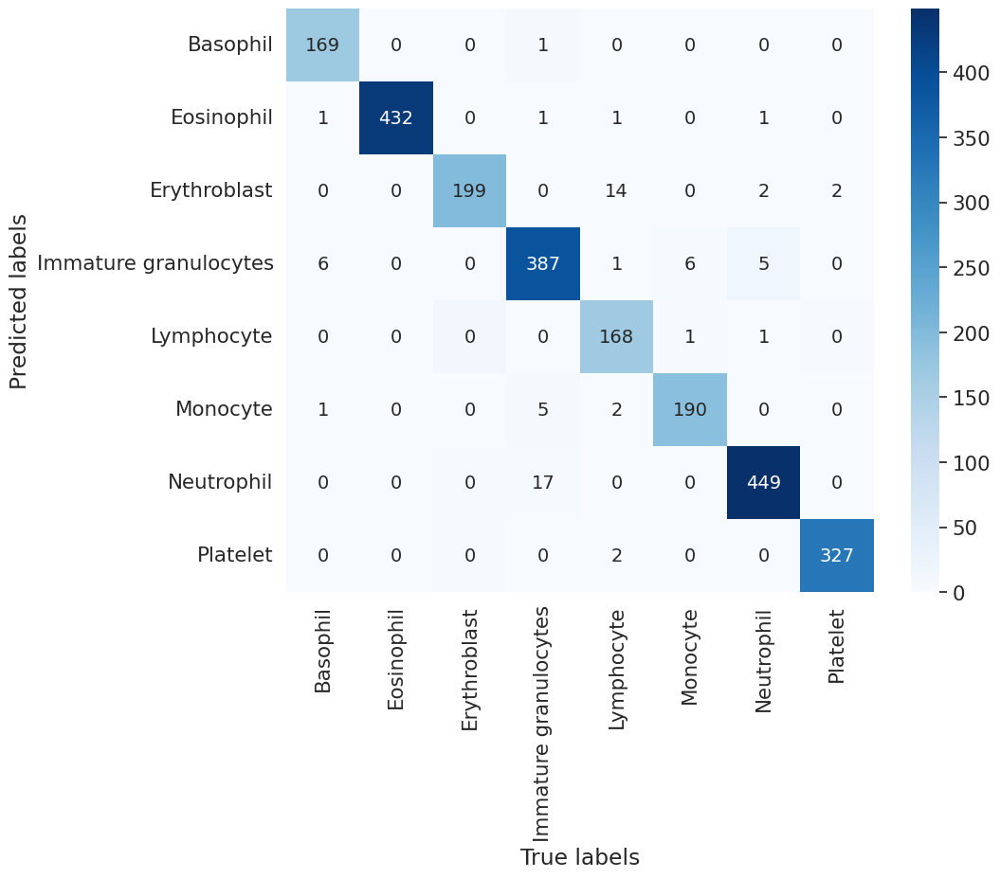

In [11]:
# Predict labels for the entire test set
predictions1 = ft_model1.predict(X_test, verbose=0)

# Convert predictions to class labels
pred_classes1 = np.argmax(predictions1, axis=-1)

# Extract ground truth classes
true_classes = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
accuracy1 = accuracy_score(true_classes, pred_classes1)
print(f'Accuracy 1 score over the test set: {round(accuracy1, 4)}')

# Calculate and display test set precision
precision1 = precision_score(true_classes, pred_classes1, average='weighted')
print(f'Precision 1 score over the test set: {round(precision1, 4)}')

# Calculate and display test set recall
recall1 = recall_score(true_classes, pred_classes1, average='weighted')
print(f'Recall score 1 over the test set: {round(recall1, 4)}')

# Calculate and display test set F1 score
f11 = f1_score(true_classes, pred_classes1, average='weighted')
print(f'F1 score 1 over the test set: {round(f11, 4)}')

# Compute the confusion matrix
cm1 = confusion_matrix(true_classes, pred_classes1)

# Combine numbers and percentages into a single string for annotation
annot1 = np.array([f"{num}" for num in cm1.flatten()]).reshape(cm1.shape)

# Define class labels
labels = {0: "Basophil", 1: "Eosinophil", 2: "Erythroblast", 3: "Immature granulocytes",
          4: "Lymphocyte", 5: "Monocyte", 6: "Neutrophil", 7: "Platelet"}

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm1.T, annot=annot1, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

Accuracy 2 score over the test set: 0.9783
Precision 2 score over the test set: 0.9785
Recall score 2 over the test set: 0.9783
F1 score 2 over the test set: 0.9783


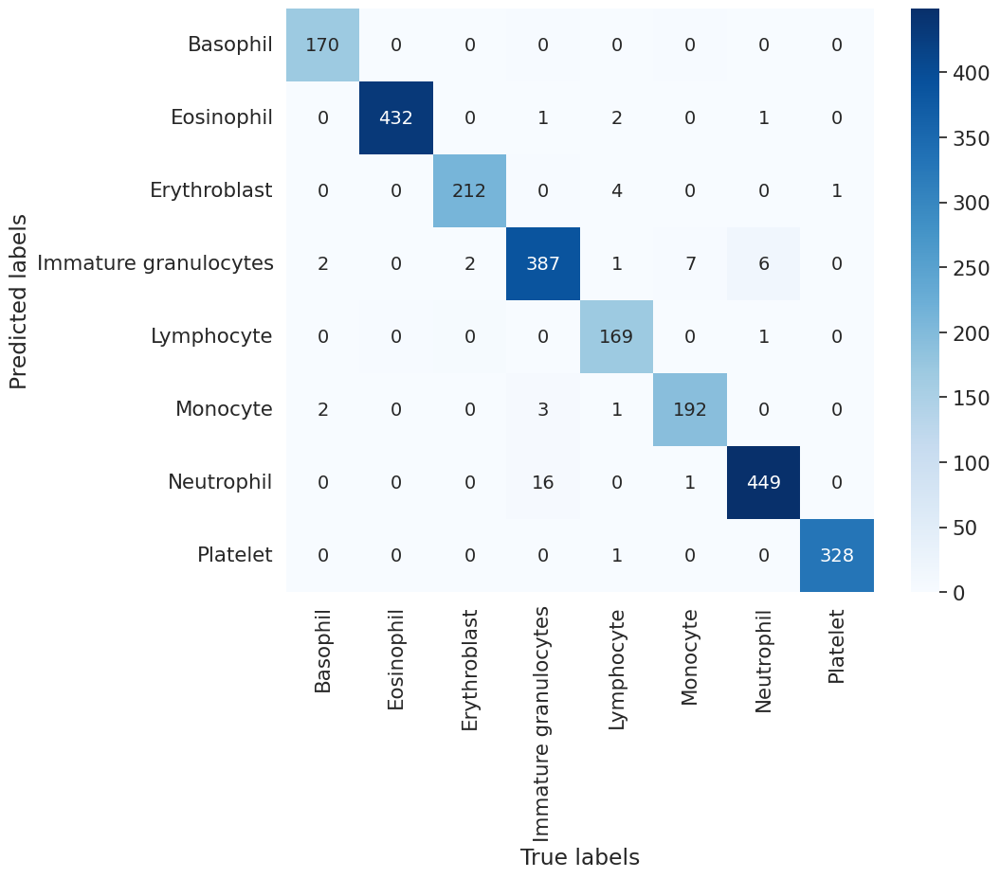

In [13]:
# Predict labels for the entire test set
predictions2 = ft_model2.predict(X_test, verbose=0)

# Convert predictions to class labels
pred_classes2 = np.argmax(predictions2, axis=-1)

# Extract ground truth classes
true_classes = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
accuracy2 = accuracy_score(true_classes, pred_classes2)
print(f'Accuracy 2 score over the test set: {round(accuracy2, 4)}')

# Calculate and display test set precision
precision2 = precision_score(true_classes, pred_classes2, average='weighted')
print(f'Precision 2 score over the test set: {round(precision2, 4)}')

# Calculate and display test set recall
recall2 = recall_score(true_classes, pred_classes2, average='weighted')
print(f'Recall score 2 over the test set: {round(recall2, 4)}')

# Calculate and display test set F1 score
f12 = f1_score(true_classes, pred_classes2, average='weighted')
print(f'F1 score 2 over the test set: {round(f12, 4)}')

# Compute the confusion matrix
cm2 = confusion_matrix(true_classes, pred_classes2)

# Combine numbers and percentages into a single string for annotation
annot2 = np.array([f"{num}" for num in cm2.flatten()]).reshape(cm2.shape)

# Define class labels
labels = {0: "Basophil", 1: "Eosinophil", 2: "Erythroblast", 3: "Immature granulocytes",
          4: "Lymphocyte", 5: "Monocyte", 6: "Neutrophil", 7: "Platelet"}

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm2.T, annot=annot2, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

Accuracy 3 score over the test set: 0.9841
Precision 3 score over the test set: 0.9842
Recall score 3 over the test set: 0.9841
F1 score 3 over the test set: 0.984


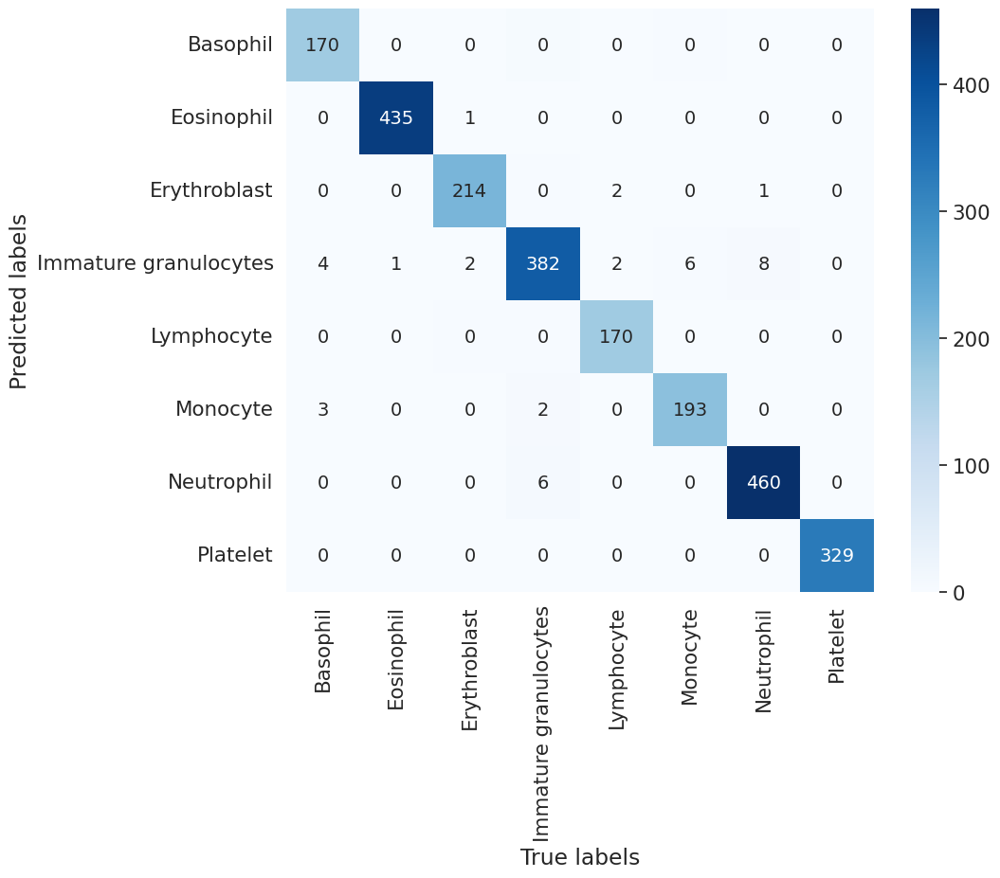

In [16]:
# Predict labels for the entire test set
predictions3 = ft_model3.predict(X_test, verbose=0)

# Convert predictions to class labels
pred_classes3 = np.argmax(predictions3, axis=-1)

# Extract ground truth classes
true_classes = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
accuracy3 = accuracy_score(true_classes, pred_classes3)
print(f'Accuracy 3 score over the test set: {round(accuracy3, 4)}')

# Calculate and display test set precision
precision3 = precision_score(true_classes, pred_classes3, average='weighted')
print(f'Precision 3 score over the test set: {round(precision3, 4)}')

# Calculate and display test set recall
recall3 = recall_score(true_classes, pred_classes3, average='weighted')
print(f'Recall score 3 over the test set: {round(recall3, 4)}')

# Calculate and display test set F1 score
f13 = f1_score(true_classes, pred_classes3, average='weighted')
print(f'F1 score 3 over the test set: {round(f13, 4)}')

# Compute the confusion matrix
cm3 = confusion_matrix(true_classes, pred_classes3)

# Combine numbers and percentages into a single string for annotation
annot3 = np.array([f"{num}" for num in cm3.flatten()]).reshape(cm3.shape)

# Define class labels
labels = {0: "Basophil", 1: "Eosinophil", 2: "Erythroblast", 3: "Immature granulocytes",
          4: "Lymphocyte", 5: "Monocyte", 6: "Neutrophil", 7: "Platelet"}

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm3.T, annot=annot3, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

#### 2. Test set with augmentation

Accuracy 1 score over the test set augmented: 0.7345
Precision 1 score over the test set augmented: 0.7431
Recall score 1 over the test set augmented: 0.7345
F1 score 1 over the test set augmented: 0.7356


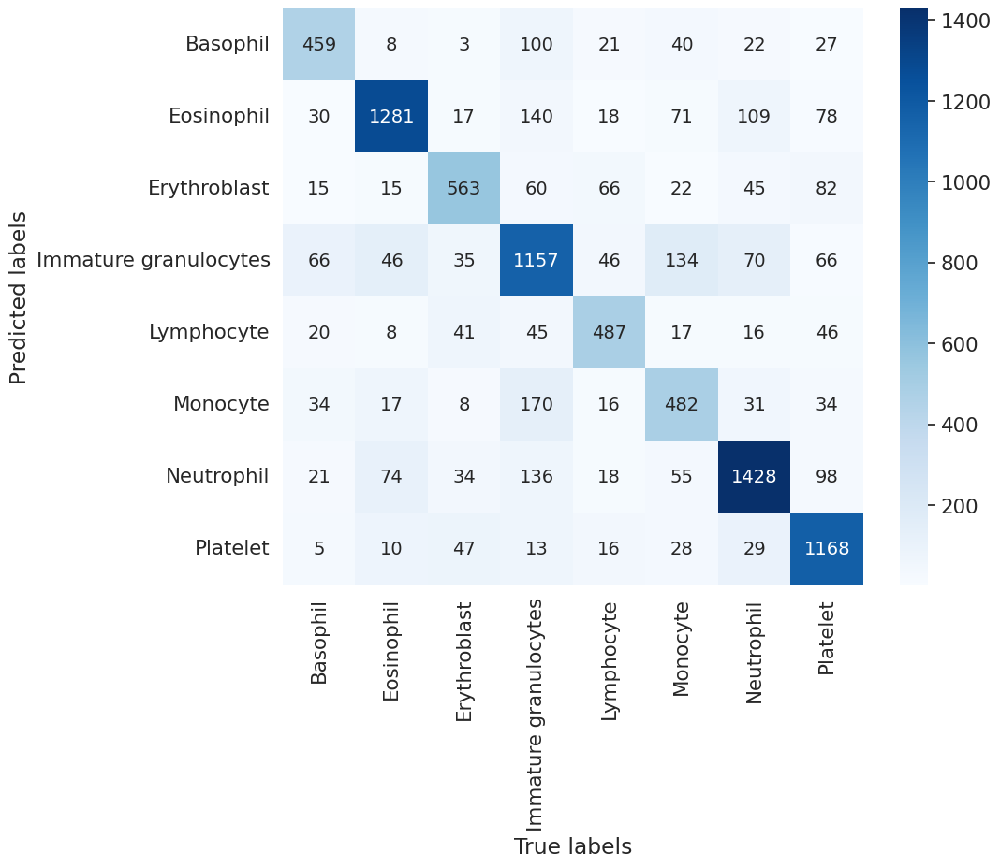

In [12]:
# Predict labels for the entire test set
predictions1_aug = ft_model1.predict(X_test_augmented, verbose=0)

# Convert predictions to class labels
pred_classes1_aug = np.argmax(predictions1_aug, axis=-1)

# Extract ground truth classes
true_classes_aug = np.argmax(y_test_augmented, axis=-1)

# Calculate and display test set accuracy
accuracy1_aug = accuracy_score(true_classes_aug, pred_classes1_aug)
print(f'Accuracy 1 score over the test set augmented: {round(accuracy1_aug, 4)}')

# Calculate and display test set precision
precision1_aug = precision_score(true_classes_aug, pred_classes1_aug, average='weighted')
print(f'Precision 1 score over the test set augmented: {round(precision1_aug, 4)}')

# Calculate and display test set recall
recall1_aug = recall_score(true_classes_aug, pred_classes1_aug, average='weighted')
print(f'Recall score 1 over the test set augmented: {round(recall1_aug, 4)}')

# Calculate and display test set F1 score
f11_aug = f1_score(true_classes_aug, pred_classes1_aug, average='weighted')
print(f'F1 score 1 over the test set augmented: {round(f11_aug, 4)}')

# Compute the confusion matrix
cm1_aug = confusion_matrix(true_classes_aug, pred_classes1_aug)

# Combine numbers and percentages into a single string for annotation
annot1_aug = np.array([f"{num}" for num in cm1_aug.flatten()]).reshape(cm1_aug.shape)

# Define class labels
labels = {0: "Basophil", 1: "Eosinophil", 2: "Erythroblast", 3: "Immature granulocytes",
          4: "Lymphocyte", 5: "Monocyte", 6: "Neutrophil", 7: "Platelet"}

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm1_aug.T, annot=annot1_aug, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

Accuracy 2 score over the test set augmented: 0.7481
Precision 2 score over the test set augmented: 0.7553
Recall score 2 over the test set augmented: 0.7481
F1 score 2 over the test set augmented: 0.7499


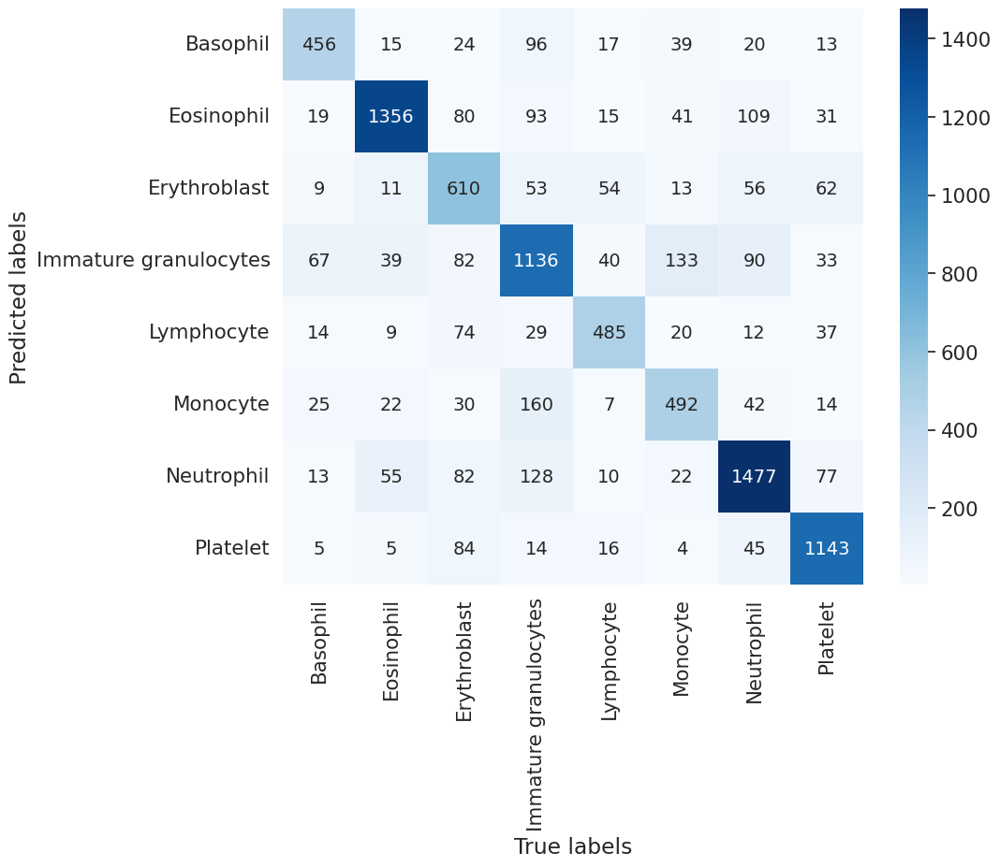

In [16]:
# Predict labels for the entire test set
predictions2_aug = ft_model2.predict(X_test_augmented, verbose=0)

# Convert predictions to class labels
pred_classes2_aug = np.argmax(predictions2_aug, axis=-1)

# Extract ground truth classes
true_classes_aug = np.argmax(y_test_augmented, axis=-1)

# Calculate and display test set accuracy
accuracy2_aug = accuracy_score(true_classes_aug, pred_classes2_aug)
print(f'Accuracy 2 score over the test set augmented: {round(accuracy2_aug, 4)}')

# Calculate and display test set precision
precision2_aug = precision_score(true_classes_aug, pred_classes2_aug, average='weighted')
print(f'Precision 2 score over the test set augmented: {round(precision2_aug, 4)}')

# Calculate and display test set recall
recall2_aug = recall_score(true_classes_aug, pred_classes2_aug, average='weighted')
print(f'Recall score 2 over the test set augmented: {round(recall2_aug, 4)}')

# Calculate and display test set F1 score
f12_aug = f1_score(true_classes_aug, pred_classes2_aug, average='weighted')
print(f'F1 score 2 over the test set augmented: {round(f12_aug, 4)}')

# Compute the confusion matrix
cm2_aug = confusion_matrix(true_classes_aug, pred_classes2_aug)

# Combine numbers and percentages into a single string for annotation
annot2_aug = np.array([f"{num}" for num in cm2_aug.flatten()]).reshape(cm2_aug.shape)

# Define class labels
labels = {0: "Basophil", 1: "Eosinophil", 2: "Erythroblast", 3: "Immature granulocytes",
          4: "Lymphocyte", 5: "Monocyte", 6: "Neutrophil", 7: "Platelet"}

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm2_aug.T, annot=annot2_aug, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

Accuracy 3 score over the test set augmented: 0.801
Precision 3 score over the test set augmented: 0.8001
Recall score 3 over the test set augmented: 0.801
F1 score 3 over the test set augmented: 0.8


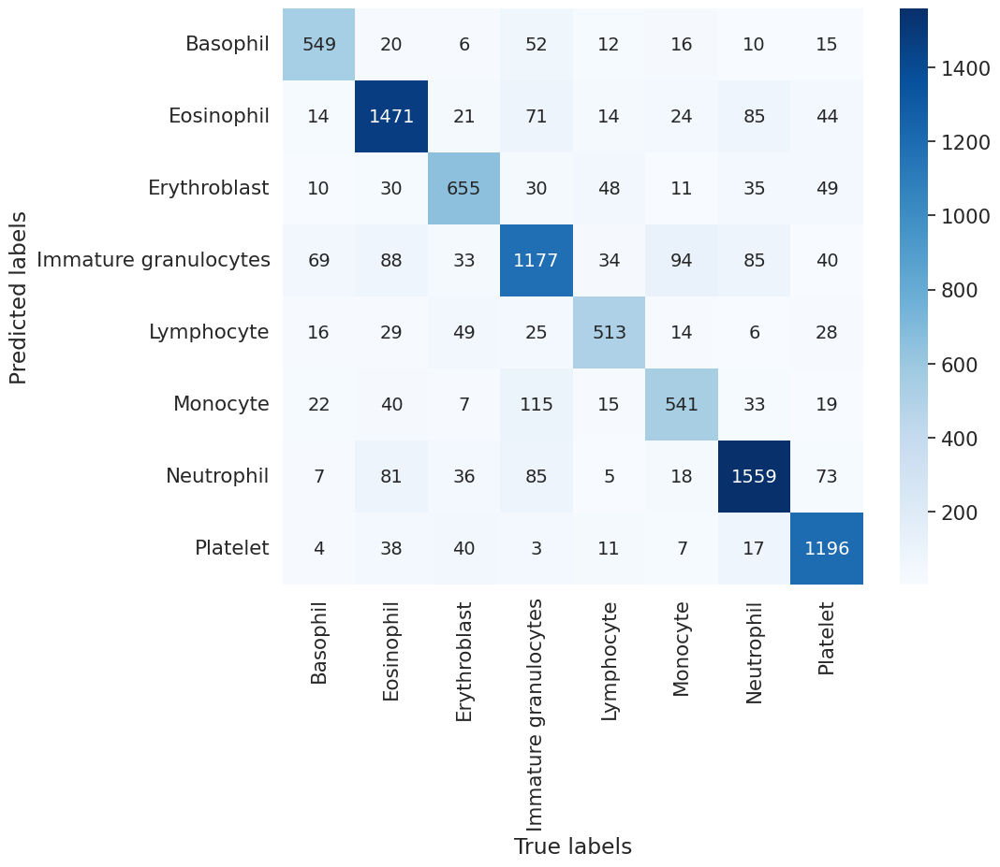

In [17]:
# Predict labels for the entire test set
predictions3_aug = ft_model3.predict(X_test_augmented, verbose=0)

# Convert predictions to class labels
pred_classes3_aug = np.argmax(predictions3_aug, axis=-1)

# Extract ground truth classes
true_classes_aug = np.argmax(y_test_augmented, axis=-1)

# Calculate and display test set accuracy
accuracy3_aug = accuracy_score(true_classes_aug, pred_classes3_aug)
print(f'Accuracy 3 score over the test set augmented: {round(accuracy3_aug, 4)}')

# Calculate and display test set precision
precision3_aug = precision_score(true_classes_aug, pred_classes3_aug, average='weighted')
print(f'Precision 3 score over the test set augmented: {round(precision3_aug, 4)}')

# Calculate and display test set recall
recall3_aug = recall_score(true_classes_aug, pred_classes3_aug, average='weighted')
print(f'Recall score 3 over the test set augmented: {round(recall3_aug, 4)}')

# Calculate and display test set F1 score
f13_aug = f1_score(true_classes_aug, pred_classes3_aug, average='weighted')
print(f'F1 score 3 over the test set augmented: {round(f13_aug, 4)}')

# Compute the confusion matrix
cm3_aug = confusion_matrix(true_classes_aug, pred_classes3_aug)

# Combine numbers and percentages into a single string for annotation
annot3_aug = np.array([f"{num}" for num in cm3_aug.flatten()]).reshape(cm3_aug.shape)

# Define class labels
labels = {0: "Basophil", 1: "Eosinophil", 2: "Erythroblast", 3: "Immature granulocytes",
          4: "Lymphocyte", 5: "Monocyte", 6: "Neutrophil", 7: "Platelet"}

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm3_aug.T, annot=annot3_aug, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

## 📊 Prepare Your Submission

To prepare your submission, create a `.zip` file that includes all the necessary code to run your model. It **must** include a `model.py` file with the following class:

```python

# file: model.py

import tensorflow as tf
import numpy as np

class Model:
    def __init__(self):
        """Initialize the internal state of the model."""

        # Load the pre-trained model weights
        self.model = tf.keras.models.load_model('weights.keras')  # Path to your saved weights

    def predict(self, X):
        """
        Return a numpy array with the labels corresponding to the input X.
        X: numpy array of input images.
        """
        predictions = self.model.predict(X)
        # Return the class labels as a numpy array
        return np.argmax(predictions, axis=-1)

The next cell shows an example implementation of the `model.py` file, which includes loading model weights from the `weights.keras` file and conducting predictions on provided input data. The `.zip` file is created and downloaded in the last notebook cell.

❗ Feel free to modify the method implementations to better fit your specific requirements, but please ensure that the class name and method interfaces remain unchanged.

In [1]:
%%writefile model.py

import numpy as np
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

class Model:
    def __init__(self):
        """
        Initialize the internal state of the model. Note that the __init__
        method cannot accept any arguments.
        """
        # Load the specific model file
        self.neural_network = tfk.models.load_model('EfficientNetV2M3_FTfull_90.67.keras')

    def predict(self, X):
        """
        Predict the labels corresponding to the input X. Note that X is a numpy
        array of shape (n_samples, 96, 96, 3) and the output should be a numpy
        array of shape (n_samples,). Therefore, outputs must not be one-hot
        encoded.

        This function returns class labels as integers.
        """
        # Get predictions and convert to label format
        preds = self.neural_network.predict(X)
        if len(preds.shape) == 2:
            preds = np.argmax(preds, axis=1)
        return preds

Overwriting model.py


In [2]:
from datetime import datetime

filename = f'submission_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

# Add files to the zip command if needed
!zip {filename} model.py EfficientNetV2M3_FTfull_90.67.keras

  adding: model.py (deflated 52%)
  adding: EfficientNetV2M3_FTfull_90.67.keras (deflated 7%)
